# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [3]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [4]:
!mkdir data

A subdirectory or file data already exists.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [5]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [6]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

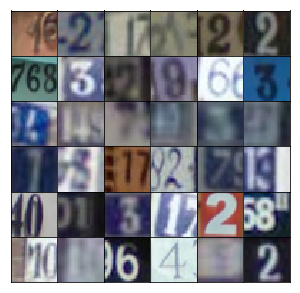

In [7]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [8]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [9]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [10]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [11]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        
        lrelu = tf.contrib.keras.layers.LeakyReLU(alpha)
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512, activation= None)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training = training)
        x1 = lrelu(x1)
        # now 4x4x512
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = training)
        x2 = lrelu(x2)
        # now 8x8x256
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides = 2, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training = training)
        x3 = lrelu(x3)
        # now 16x16x128
        
        
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides = 2, padding = 'same')
        # now 32x32xoutput_dim
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [12]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        
        lrelu = tf.contrib.keras.layers.LeakyReLU(alpha)
        
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides = 2, padding = 'same')
        x1 = lrelu(x1)
        #now 16x16x64
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = True)
        x2 = lrelu(x2)
        # now 8x8x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides = 2, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training = True)
        x3 = lrelu(x3)
        # now 4x4x256
        
        flattened = tf.reshape(x3, (-1, 4*4*256))
        
        logits = tf.layers.dense(flattened, 1, activation = None)
        out =  tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [13]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [14]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [15]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [16]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [17]:
def train(net, dataset, epochs, batch_size, print_every=25, show_every=400, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [18]:
real_size = (32,32,3)
z_size = 100
learning_rate = 1e-4
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 0.7652... Generator Loss: 1.0754
Epoch 1/25... Discriminator Loss: 0.3278... Generator Loss: 2.1378
Epoch 1/25... Discriminator Loss: 0.2140... Generator Loss: 2.6131
Epoch 1/25... Discriminator Loss: 0.1869... Generator Loss: 2.4925
Epoch 1/25... Discriminator Loss: 0.1603... Generator Loss: 2.6412
Epoch 1/25... Discriminator Loss: 0.8754... Generator Loss: 1.0336
Epoch 1/25... Discriminator Loss: 0.4393... Generator Loss: 1.7364
Epoch 1/25... Discriminator Loss: 0.7796... Generator Loss: 2.6008
Epoch 1/25... Discriminator Loss: 0.7185... Generator Loss: 2.9728
Epoch 1/25... Discriminator Loss: 0.3267... Generator Loss: 2.3470
Epoch 1/25... Discriminator Loss: 0.3638... Generator Loss: 2.4757
Epoch 1/25... Discriminator Loss: 0.2376... Generator Loss: 2.4654
Epoch 1/25... Discriminator Loss: 0.4534... Generator Loss: 1.4282
Epoch 1/25... Discriminator Loss: 1.0857... Generator Loss: 1.1422
Epoch 1/25... Discriminator Loss: 0.9620... Generator Loss: 1.

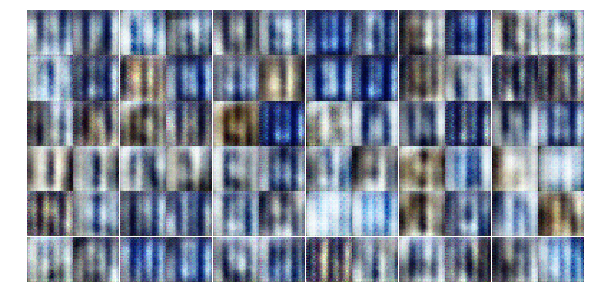

Epoch 1/25... Discriminator Loss: 0.2854... Generator Loss: 2.3202
Epoch 1/25... Discriminator Loss: 0.2502... Generator Loss: 2.1809
Epoch 1/25... Discriminator Loss: 0.1999... Generator Loss: 2.4906
Epoch 1/25... Discriminator Loss: 0.2502... Generator Loss: 2.3469
Epoch 1/25... Discriminator Loss: 0.4556... Generator Loss: 2.0252
Epoch 1/25... Discriminator Loss: 0.4549... Generator Loss: 1.8074
Epoch 2/25... Discriminator Loss: 0.3102... Generator Loss: 2.7487
Epoch 2/25... Discriminator Loss: 0.6601... Generator Loss: 1.8443
Epoch 2/25... Discriminator Loss: 0.5757... Generator Loss: 1.5802
Epoch 2/25... Discriminator Loss: 0.3868... Generator Loss: 1.4562
Epoch 2/25... Discriminator Loss: 0.9134... Generator Loss: 2.3671
Epoch 2/25... Discriminator Loss: 0.7670... Generator Loss: 1.3781
Epoch 2/25... Discriminator Loss: 0.3468... Generator Loss: 2.1164
Epoch 2/25... Discriminator Loss: 0.2913... Generator Loss: 3.2675
Epoch 2/25... Discriminator Loss: 0.1203... Generator Loss: 2.

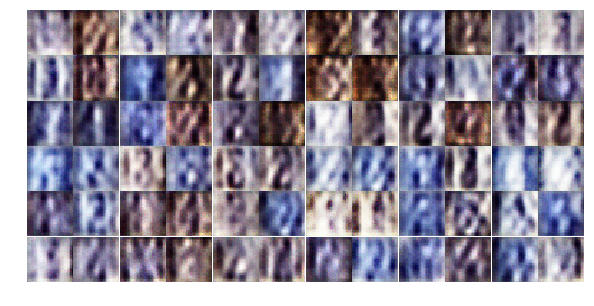

Epoch 2/25... Discriminator Loss: 0.3383... Generator Loss: 2.6547
Epoch 2/25... Discriminator Loss: 0.4572... Generator Loss: 2.5138
Epoch 2/25... Discriminator Loss: 0.2806... Generator Loss: 2.8733
Epoch 2/25... Discriminator Loss: 0.8850... Generator Loss: 0.9736
Epoch 2/25... Discriminator Loss: 0.6502... Generator Loss: 2.5398
Epoch 2/25... Discriminator Loss: 1.0627... Generator Loss: 2.2820
Epoch 2/25... Discriminator Loss: 0.8245... Generator Loss: 1.1073
Epoch 2/25... Discriminator Loss: 0.7238... Generator Loss: 1.4641
Epoch 2/25... Discriminator Loss: 0.5435... Generator Loss: 1.9984
Epoch 2/25... Discriminator Loss: 0.6152... Generator Loss: 1.3529
Epoch 2/25... Discriminator Loss: 1.1465... Generator Loss: 0.6548
Epoch 2/25... Discriminator Loss: 0.7134... Generator Loss: 1.4423
Epoch 2/25... Discriminator Loss: 0.5689... Generator Loss: 1.4802
Epoch 3/25... Discriminator Loss: 0.4373... Generator Loss: 2.1738
Epoch 3/25... Discriminator Loss: 0.7152... Generator Loss: 1.

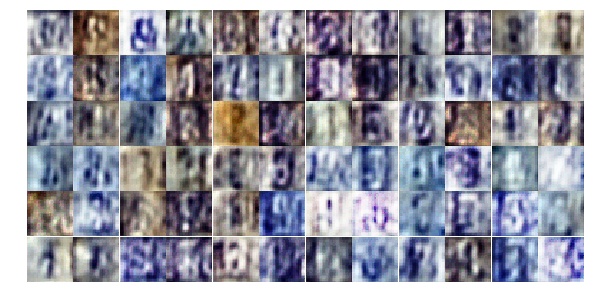

Epoch 3/25... Discriminator Loss: 0.6289... Generator Loss: 1.2612
Epoch 3/25... Discriminator Loss: 0.6274... Generator Loss: 1.1786
Epoch 3/25... Discriminator Loss: 0.7521... Generator Loss: 1.6252
Epoch 3/25... Discriminator Loss: 1.7505... Generator Loss: 0.3364
Epoch 3/25... Discriminator Loss: 0.7605... Generator Loss: 1.1754
Epoch 3/25... Discriminator Loss: 0.9655... Generator Loss: 1.0046
Epoch 3/25... Discriminator Loss: 0.9075... Generator Loss: 0.9687
Epoch 3/25... Discriminator Loss: 0.8961... Generator Loss: 1.0790
Epoch 3/25... Discriminator Loss: 0.7743... Generator Loss: 1.3720
Epoch 3/25... Discriminator Loss: 0.7599... Generator Loss: 1.1343
Epoch 3/25... Discriminator Loss: 0.9858... Generator Loss: 0.8521
Epoch 3/25... Discriminator Loss: 0.9898... Generator Loss: 0.7575
Epoch 3/25... Discriminator Loss: 0.5981... Generator Loss: 1.4091
Epoch 3/25... Discriminator Loss: 1.1335... Generator Loss: 2.6514
Epoch 3/25... Discriminator Loss: 0.9586... Generator Loss: 0.

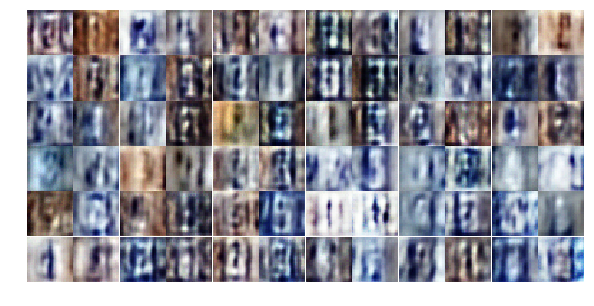

Epoch 3/25... Discriminator Loss: 0.8213... Generator Loss: 1.0112
Epoch 3/25... Discriminator Loss: 0.5259... Generator Loss: 1.6098
Epoch 3/25... Discriminator Loss: 0.7585... Generator Loss: 0.9258
Epoch 3/25... Discriminator Loss: 1.2870... Generator Loss: 0.8469
Epoch 4/25... Discriminator Loss: 1.1429... Generator Loss: 1.0635
Epoch 4/25... Discriminator Loss: 0.8688... Generator Loss: 1.2274
Epoch 4/25... Discriminator Loss: 0.8142... Generator Loss: 1.3461
Epoch 4/25... Discriminator Loss: 0.5187... Generator Loss: 1.8236
Epoch 4/25... Discriminator Loss: 1.5786... Generator Loss: 0.4950
Epoch 4/25... Discriminator Loss: 1.0176... Generator Loss: 0.7090
Epoch 4/25... Discriminator Loss: 0.5156... Generator Loss: 1.8015
Epoch 4/25... Discriminator Loss: 0.6816... Generator Loss: 1.2968
Epoch 4/25... Discriminator Loss: 0.7159... Generator Loss: 1.2709
Epoch 4/25... Discriminator Loss: 0.7622... Generator Loss: 0.9146
Epoch 4/25... Discriminator Loss: 0.5329... Generator Loss: 1.

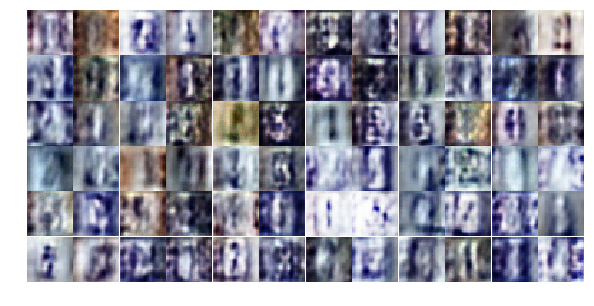

Epoch 4/25... Discriminator Loss: 0.5368... Generator Loss: 1.7613
Epoch 4/25... Discriminator Loss: 0.5722... Generator Loss: 1.7560
Epoch 4/25... Discriminator Loss: 0.9644... Generator Loss: 1.7401
Epoch 4/25... Discriminator Loss: 0.6562... Generator Loss: 1.0530
Epoch 4/25... Discriminator Loss: 0.5477... Generator Loss: 1.4677
Epoch 4/25... Discriminator Loss: 0.4366... Generator Loss: 1.8726
Epoch 4/25... Discriminator Loss: 0.5498... Generator Loss: 2.0126
Epoch 4/25... Discriminator Loss: 0.5525... Generator Loss: 2.0403
Epoch 4/25... Discriminator Loss: 0.7291... Generator Loss: 1.6190
Epoch 4/25... Discriminator Loss: 0.5586... Generator Loss: 1.5874
Epoch 4/25... Discriminator Loss: 0.4148... Generator Loss: 1.7902
Epoch 5/25... Discriminator Loss: 0.4961... Generator Loss: 1.7356
Epoch 5/25... Discriminator Loss: 0.4729... Generator Loss: 1.4043
Epoch 5/25... Discriminator Loss: 0.4081... Generator Loss: 2.0111
Epoch 5/25... Discriminator Loss: 0.3928... Generator Loss: 2.

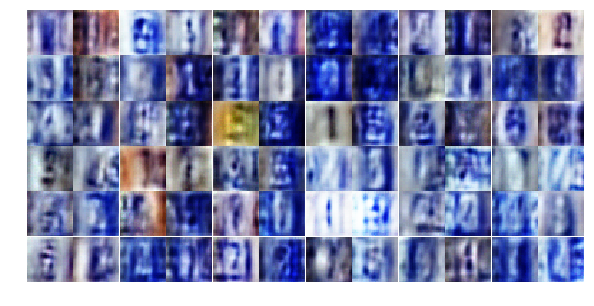

Epoch 5/25... Discriminator Loss: 0.5583... Generator Loss: 1.2580
Epoch 5/25... Discriminator Loss: 0.6312... Generator Loss: 1.5942
Epoch 5/25... Discriminator Loss: 0.5700... Generator Loss: 1.3150
Epoch 5/25... Discriminator Loss: 0.3831... Generator Loss: 1.9489
Epoch 5/25... Discriminator Loss: 0.6820... Generator Loss: 1.0337
Epoch 5/25... Discriminator Loss: 0.7942... Generator Loss: 0.9673
Epoch 5/25... Discriminator Loss: 0.6640... Generator Loss: 1.4093
Epoch 5/25... Discriminator Loss: 0.3607... Generator Loss: 2.0389
Epoch 5/25... Discriminator Loss: 0.5890... Generator Loss: 1.1394
Epoch 5/25... Discriminator Loss: 0.5172... Generator Loss: 1.2287
Epoch 5/25... Discriminator Loss: 0.5011... Generator Loss: 1.4287
Epoch 5/25... Discriminator Loss: 0.5982... Generator Loss: 1.0991
Epoch 5/25... Discriminator Loss: 0.4666... Generator Loss: 1.4181
Epoch 5/25... Discriminator Loss: 0.8254... Generator Loss: 1.0022
Epoch 5/25... Discriminator Loss: 0.4981... Generator Loss: 4.

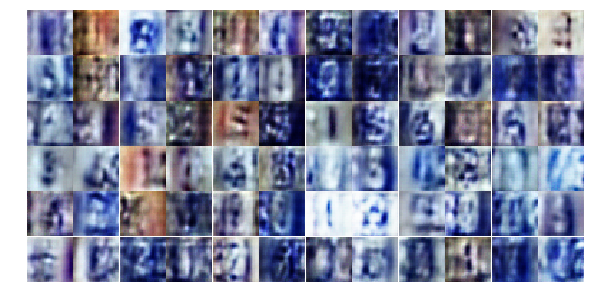

Epoch 5/25... Discriminator Loss: 0.6753... Generator Loss: 1.7888
Epoch 5/25... Discriminator Loss: 1.1256... Generator Loss: 0.6064
Epoch 6/25... Discriminator Loss: 0.3070... Generator Loss: 2.0796
Epoch 6/25... Discriminator Loss: 0.6174... Generator Loss: 1.2794
Epoch 6/25... Discriminator Loss: 0.4869... Generator Loss: 1.3894
Epoch 6/25... Discriminator Loss: 0.3405... Generator Loss: 2.0418
Epoch 6/25... Discriminator Loss: 0.2395... Generator Loss: 3.3115
Epoch 6/25... Discriminator Loss: 0.7176... Generator Loss: 1.0586
Epoch 6/25... Discriminator Loss: 0.2812... Generator Loss: 2.3178
Epoch 6/25... Discriminator Loss: 0.7368... Generator Loss: 4.3927
Epoch 6/25... Discriminator Loss: 0.3902... Generator Loss: 1.6260
Epoch 6/25... Discriminator Loss: 0.4845... Generator Loss: 1.3017
Epoch 6/25... Discriminator Loss: 0.4317... Generator Loss: 1.6833
Epoch 6/25... Discriminator Loss: 0.2851... Generator Loss: 2.0103
Epoch 6/25... Discriminator Loss: 0.2906... Generator Loss: 2.

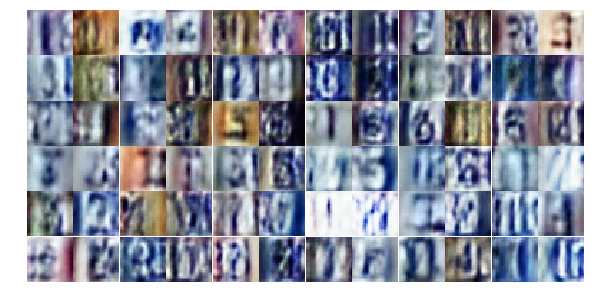

Epoch 6/25... Discriminator Loss: 0.3270... Generator Loss: 1.8703
Epoch 6/25... Discriminator Loss: 0.3997... Generator Loss: 1.5810
Epoch 6/25... Discriminator Loss: 0.2941... Generator Loss: 2.7394
Epoch 6/25... Discriminator Loss: 0.2980... Generator Loss: 1.8867
Epoch 6/25... Discriminator Loss: 1.4382... Generator Loss: 0.5950
Epoch 6/25... Discriminator Loss: 0.2944... Generator Loss: 2.1744
Epoch 6/25... Discriminator Loss: 0.3317... Generator Loss: 1.7111
Epoch 6/25... Discriminator Loss: 1.0056... Generator Loss: 0.7301
Epoch 6/25... Discriminator Loss: 0.3124... Generator Loss: 1.8005
Epoch 7/25... Discriminator Loss: 0.3221... Generator Loss: 2.3159
Epoch 7/25... Discriminator Loss: 0.3609... Generator Loss: 1.8569
Epoch 7/25... Discriminator Loss: 0.5692... Generator Loss: 2.6374
Epoch 7/25... Discriminator Loss: 0.4247... Generator Loss: 1.9657
Epoch 7/25... Discriminator Loss: 0.3049... Generator Loss: 1.8315
Epoch 7/25... Discriminator Loss: 0.3993... Generator Loss: 1.

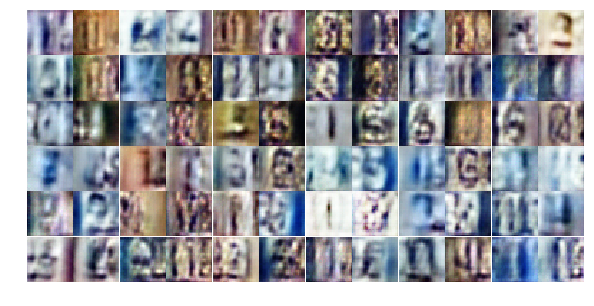

Epoch 7/25... Discriminator Loss: 0.4317... Generator Loss: 1.5024
Epoch 7/25... Discriminator Loss: 0.1961... Generator Loss: 2.4201
Epoch 7/25... Discriminator Loss: 0.3250... Generator Loss: 2.2327
Epoch 7/25... Discriminator Loss: 0.3539... Generator Loss: 2.5401
Epoch 7/25... Discriminator Loss: 0.3806... Generator Loss: 1.7606
Epoch 7/25... Discriminator Loss: 0.4045... Generator Loss: 1.6377
Epoch 7/25... Discriminator Loss: 0.4377... Generator Loss: 1.9008
Epoch 7/25... Discriminator Loss: 0.1707... Generator Loss: 2.5325
Epoch 7/25... Discriminator Loss: 0.2024... Generator Loss: 2.5962
Epoch 7/25... Discriminator Loss: 0.2524... Generator Loss: 2.0690
Epoch 7/25... Discriminator Loss: 0.3603... Generator Loss: 1.6527
Epoch 7/25... Discriminator Loss: 0.2637... Generator Loss: 2.5918
Epoch 7/25... Discriminator Loss: 0.5799... Generator Loss: 1.2071
Epoch 7/25... Discriminator Loss: 0.2726... Generator Loss: 1.9524
Epoch 7/25... Discriminator Loss: 0.4110... Generator Loss: 2.

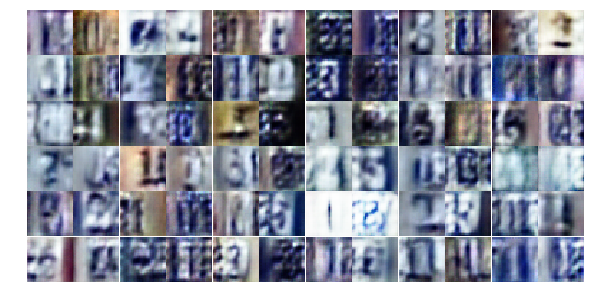

Epoch 8/25... Discriminator Loss: 0.1935... Generator Loss: 2.4355
Epoch 8/25... Discriminator Loss: 0.3352... Generator Loss: 1.7952
Epoch 8/25... Discriminator Loss: 0.2778... Generator Loss: 1.9449
Epoch 8/25... Discriminator Loss: 0.3109... Generator Loss: 2.0452
Epoch 8/25... Discriminator Loss: 0.2472... Generator Loss: 2.2492
Epoch 8/25... Discriminator Loss: 0.3927... Generator Loss: 1.7964
Epoch 8/25... Discriminator Loss: 0.3651... Generator Loss: 1.7498
Epoch 8/25... Discriminator Loss: 0.5576... Generator Loss: 1.1605
Epoch 8/25... Discriminator Loss: 0.1813... Generator Loss: 2.5270
Epoch 8/25... Discriminator Loss: 0.2290... Generator Loss: 2.4606
Epoch 8/25... Discriminator Loss: 0.4271... Generator Loss: 1.4972
Epoch 8/25... Discriminator Loss: 0.3300... Generator Loss: 1.8258
Epoch 8/25... Discriminator Loss: 0.3504... Generator Loss: 1.9530
Epoch 8/25... Discriminator Loss: 0.2204... Generator Loss: 2.1522
Epoch 8/25... Discriminator Loss: 0.4148... Generator Loss: 2.

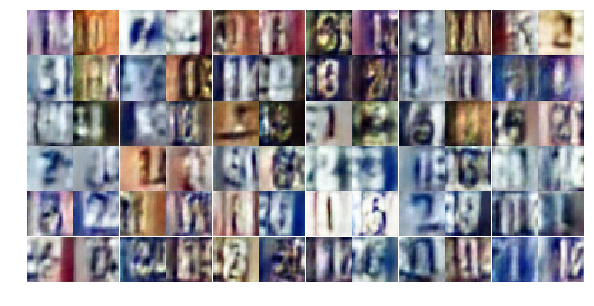

Epoch 8/25... Discriminator Loss: 0.3732... Generator Loss: 1.6078
Epoch 8/25... Discriminator Loss: 0.5945... Generator Loss: 3.1031
Epoch 8/25... Discriminator Loss: 0.1963... Generator Loss: 2.6472
Epoch 8/25... Discriminator Loss: 0.4470... Generator Loss: 1.4964
Epoch 8/25... Discriminator Loss: 0.3263... Generator Loss: 1.7232
Epoch 8/25... Discriminator Loss: 0.3171... Generator Loss: 2.6652
Epoch 8/25... Discriminator Loss: 0.6100... Generator Loss: 1.0360
Epoch 9/25... Discriminator Loss: 0.5825... Generator Loss: 1.0591
Epoch 9/25... Discriminator Loss: 0.2708... Generator Loss: 1.9229
Epoch 9/25... Discriminator Loss: 1.1861... Generator Loss: 3.2246
Epoch 9/25... Discriminator Loss: 0.3284... Generator Loss: 1.7833
Epoch 9/25... Discriminator Loss: 0.3792... Generator Loss: 1.7813
Epoch 9/25... Discriminator Loss: 0.5387... Generator Loss: 1.2139
Epoch 9/25... Discriminator Loss: 0.4592... Generator Loss: 1.4318
Epoch 9/25... Discriminator Loss: 0.2536... Generator Loss: 2.

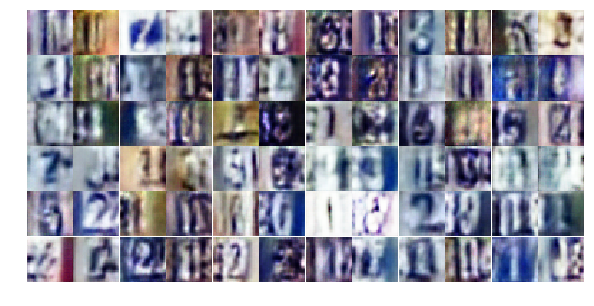

Epoch 9/25... Discriminator Loss: 0.3326... Generator Loss: 1.6756
Epoch 9/25... Discriminator Loss: 0.2794... Generator Loss: 1.9776
Epoch 9/25... Discriminator Loss: 0.2562... Generator Loss: 1.9680
Epoch 9/25... Discriminator Loss: 0.6412... Generator Loss: 1.0459
Epoch 9/25... Discriminator Loss: 0.3158... Generator Loss: 2.4155
Epoch 9/25... Discriminator Loss: 0.3799... Generator Loss: 1.7137
Epoch 9/25... Discriminator Loss: 0.3099... Generator Loss: 1.9573
Epoch 9/25... Discriminator Loss: 0.5357... Generator Loss: 1.3887
Epoch 9/25... Discriminator Loss: 0.5769... Generator Loss: 1.0736
Epoch 9/25... Discriminator Loss: 0.3505... Generator Loss: 2.8438
Epoch 9/25... Discriminator Loss: 0.3718... Generator Loss: 1.6222
Epoch 9/25... Discriminator Loss: 0.5908... Generator Loss: 1.2009
Epoch 9/25... Discriminator Loss: 0.6141... Generator Loss: 1.0980
Epoch 9/25... Discriminator Loss: 0.2725... Generator Loss: 2.2960
Epoch 10/25... Discriminator Loss: 0.2769... Generator Loss: 2

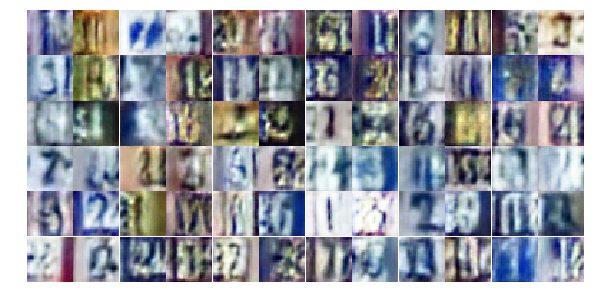

Epoch 10/25... Discriminator Loss: 0.9870... Generator Loss: 0.6814
Epoch 10/25... Discriminator Loss: 0.2708... Generator Loss: 1.9757
Epoch 10/25... Discriminator Loss: 0.2854... Generator Loss: 1.9255
Epoch 10/25... Discriminator Loss: 0.4106... Generator Loss: 1.4873
Epoch 10/25... Discriminator Loss: 0.2679... Generator Loss: 2.5024
Epoch 10/25... Discriminator Loss: 0.3768... Generator Loss: 1.5727
Epoch 10/25... Discriminator Loss: 0.3298... Generator Loss: 1.8418
Epoch 10/25... Discriminator Loss: 0.2508... Generator Loss: 2.7430
Epoch 10/25... Discriminator Loss: 0.3111... Generator Loss: 1.9327
Epoch 10/25... Discriminator Loss: 0.9047... Generator Loss: 0.6558
Epoch 10/25... Discriminator Loss: 0.4082... Generator Loss: 2.0277
Epoch 10/25... Discriminator Loss: 0.6817... Generator Loss: 0.9508
Epoch 10/25... Discriminator Loss: 0.6840... Generator Loss: 3.1579
Epoch 10/25... Discriminator Loss: 0.4338... Generator Loss: 1.5051
Epoch 10/25... Discriminator Loss: 0.2423... Gen

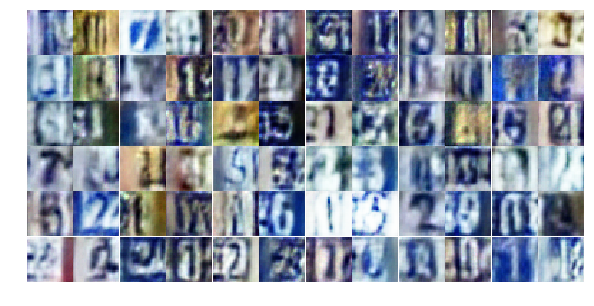

Epoch 10/25... Discriminator Loss: 0.6155... Generator Loss: 1.0073
Epoch 10/25... Discriminator Loss: 0.2714... Generator Loss: 2.4183
Epoch 10/25... Discriminator Loss: 0.3370... Generator Loss: 1.7178
Epoch 10/25... Discriminator Loss: 0.2799... Generator Loss: 2.0564
Epoch 10/25... Discriminator Loss: 0.6826... Generator Loss: 1.3957
Epoch 11/25... Discriminator Loss: 0.4075... Generator Loss: 1.4088
Epoch 11/25... Discriminator Loss: 0.3196... Generator Loss: 1.9653
Epoch 11/25... Discriminator Loss: 0.1967... Generator Loss: 3.2180
Epoch 11/25... Discriminator Loss: 0.4282... Generator Loss: 1.4214
Epoch 11/25... Discriminator Loss: 0.4091... Generator Loss: 1.9406
Epoch 11/25... Discriminator Loss: 0.4594... Generator Loss: 1.3806
Epoch 11/25... Discriminator Loss: 0.4908... Generator Loss: 1.3186
Epoch 11/25... Discriminator Loss: 0.2904... Generator Loss: 1.9956
Epoch 11/25... Discriminator Loss: 0.4121... Generator Loss: 1.5565
Epoch 11/25... Discriminator Loss: 0.5956... Gen

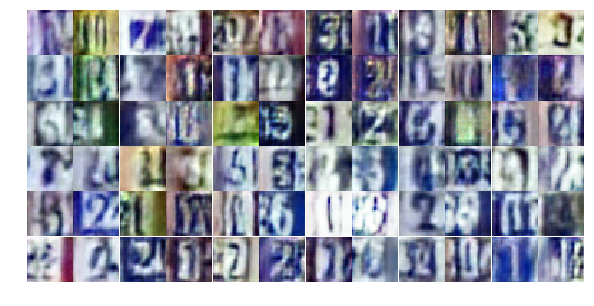

Epoch 11/25... Discriminator Loss: 0.5032... Generator Loss: 2.2268
Epoch 11/25... Discriminator Loss: 0.4800... Generator Loss: 1.3291
Epoch 11/25... Discriminator Loss: 0.4269... Generator Loss: 1.4205
Epoch 11/25... Discriminator Loss: 0.3921... Generator Loss: 1.4879
Epoch 11/25... Discriminator Loss: 0.4068... Generator Loss: 1.7009
Epoch 11/25... Discriminator Loss: 0.3969... Generator Loss: 1.5091
Epoch 11/25... Discriminator Loss: 0.5609... Generator Loss: 1.1021
Epoch 11/25... Discriminator Loss: 0.2680... Generator Loss: 2.2081
Epoch 11/25... Discriminator Loss: 0.3436... Generator Loss: 2.5035
Epoch 11/25... Discriminator Loss: 0.8994... Generator Loss: 0.7055
Epoch 11/25... Discriminator Loss: 1.1541... Generator Loss: 0.9430
Epoch 11/25... Discriminator Loss: 0.3836... Generator Loss: 1.9921
Epoch 12/25... Discriminator Loss: 0.5422... Generator Loss: 1.4174
Epoch 12/25... Discriminator Loss: 0.3704... Generator Loss: 1.5596
Epoch 12/25... Discriminator Loss: 0.2820... Gen

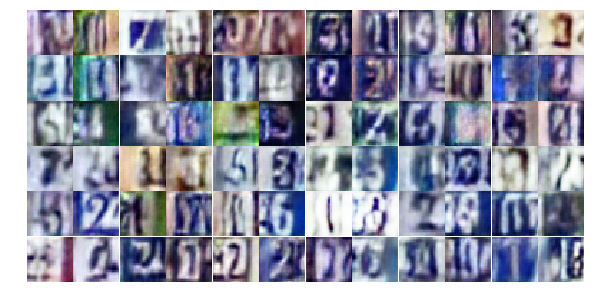

Epoch 12/25... Discriminator Loss: 0.2598... Generator Loss: 2.7432
Epoch 12/25... Discriminator Loss: 0.3097... Generator Loss: 2.3299
Epoch 12/25... Discriminator Loss: 0.4288... Generator Loss: 1.9033
Epoch 12/25... Discriminator Loss: 0.4097... Generator Loss: 1.4412
Epoch 12/25... Discriminator Loss: 0.3916... Generator Loss: 1.5287
Epoch 12/25... Discriminator Loss: 0.2302... Generator Loss: 2.4200
Epoch 12/25... Discriminator Loss: 0.3411... Generator Loss: 1.8254
Epoch 12/25... Discriminator Loss: 0.1737... Generator Loss: 2.6769
Epoch 12/25... Discriminator Loss: 0.6316... Generator Loss: 1.1088
Epoch 12/25... Discriminator Loss: 0.3325... Generator Loss: 2.5667
Epoch 12/25... Discriminator Loss: 0.9574... Generator Loss: 0.7379
Epoch 12/25... Discriminator Loss: 0.1598... Generator Loss: 2.4670
Epoch 12/25... Discriminator Loss: 0.1739... Generator Loss: 2.4847
Epoch 12/25... Discriminator Loss: 0.7817... Generator Loss: 0.8406
Epoch 12/25... Discriminator Loss: 0.3861... Gen

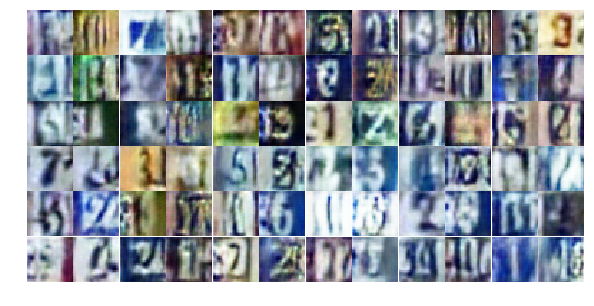

Epoch 12/25... Discriminator Loss: 0.5586... Generator Loss: 1.6661
Epoch 12/25... Discriminator Loss: 0.3020... Generator Loss: 2.1751
Epoch 12/25... Discriminator Loss: 0.3488... Generator Loss: 1.9337
Epoch 13/25... Discriminator Loss: 0.7111... Generator Loss: 0.8997
Epoch 13/25... Discriminator Loss: 0.5427... Generator Loss: 1.7740
Epoch 13/25... Discriminator Loss: 0.3394... Generator Loss: 1.6152
Epoch 13/25... Discriminator Loss: 0.2706... Generator Loss: 2.7637
Epoch 13/25... Discriminator Loss: 0.4077... Generator Loss: 1.4311
Epoch 13/25... Discriminator Loss: 0.4542... Generator Loss: 3.1733
Epoch 13/25... Discriminator Loss: 0.3020... Generator Loss: 1.9743
Epoch 13/25... Discriminator Loss: 0.2204... Generator Loss: 2.3581
Epoch 13/25... Discriminator Loss: 0.9154... Generator Loss: 0.7034
Epoch 13/25... Discriminator Loss: 0.4377... Generator Loss: 1.4170
Epoch 13/25... Discriminator Loss: 0.3192... Generator Loss: 1.6548
Epoch 13/25... Discriminator Loss: 0.4019... Gen

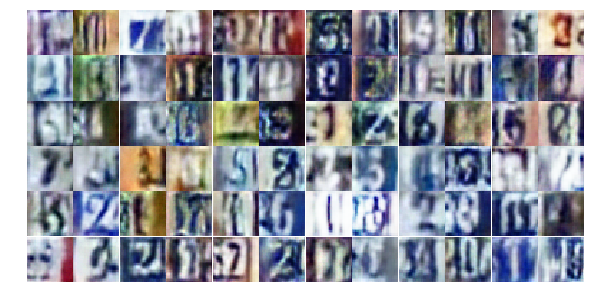

Epoch 13/25... Discriminator Loss: 0.5480... Generator Loss: 1.1034
Epoch 13/25... Discriminator Loss: 0.2938... Generator Loss: 2.5863
Epoch 13/25... Discriminator Loss: 0.2554... Generator Loss: 2.2031
Epoch 13/25... Discriminator Loss: 0.4303... Generator Loss: 1.3570
Epoch 13/25... Discriminator Loss: 0.4084... Generator Loss: 1.5262
Epoch 13/25... Discriminator Loss: 0.7056... Generator Loss: 2.4930
Epoch 13/25... Discriminator Loss: 0.4195... Generator Loss: 1.3813
Epoch 13/25... Discriminator Loss: 0.4742... Generator Loss: 1.2577
Epoch 13/25... Discriminator Loss: 1.0108... Generator Loss: 0.6446
Epoch 14/25... Discriminator Loss: 0.4250... Generator Loss: 1.5063
Epoch 14/25... Discriminator Loss: 0.3573... Generator Loss: 1.8119
Epoch 14/25... Discriminator Loss: 0.6114... Generator Loss: 1.1080
Epoch 14/25... Discriminator Loss: 0.3063... Generator Loss: 1.8422
Epoch 14/25... Discriminator Loss: 0.2614... Generator Loss: 1.8875
Epoch 14/25... Discriminator Loss: 0.3522... Gen

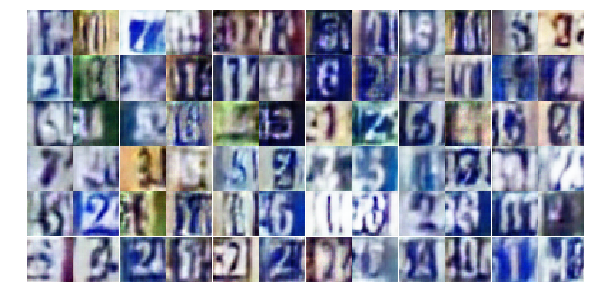

Epoch 14/25... Discriminator Loss: 0.4368... Generator Loss: 1.5997
Epoch 14/25... Discriminator Loss: 0.4839... Generator Loss: 1.3860
Epoch 14/25... Discriminator Loss: 0.5535... Generator Loss: 1.2087
Epoch 14/25... Discriminator Loss: 0.1488... Generator Loss: 2.8984
Epoch 14/25... Discriminator Loss: 0.2974... Generator Loss: 1.7661
Epoch 14/25... Discriminator Loss: 0.2964... Generator Loss: 1.7603
Epoch 14/25... Discriminator Loss: 0.3259... Generator Loss: 1.7933
Epoch 14/25... Discriminator Loss: 0.5405... Generator Loss: 1.2185
Epoch 14/25... Discriminator Loss: 0.4867... Generator Loss: 1.2920
Epoch 14/25... Discriminator Loss: 0.4703... Generator Loss: 1.3707
Epoch 14/25... Discriminator Loss: 0.5038... Generator Loss: 1.3094
Epoch 14/25... Discriminator Loss: 1.9500... Generator Loss: 3.5992
Epoch 14/25... Discriminator Loss: 0.4403... Generator Loss: 1.3991
Epoch 14/25... Discriminator Loss: 0.4444... Generator Loss: 1.4474
Epoch 14/25... Discriminator Loss: 0.5765... Gen

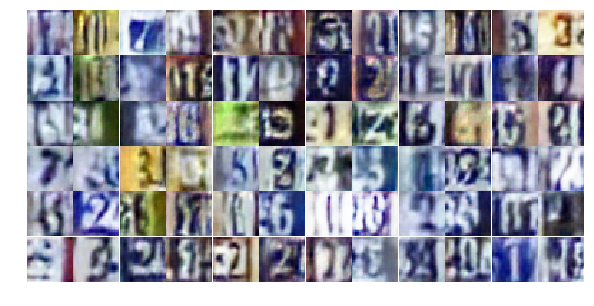

Epoch 15/25... Discriminator Loss: 0.3779... Generator Loss: 1.9630
Epoch 15/25... Discriminator Loss: 0.3802... Generator Loss: 1.6016
Epoch 15/25... Discriminator Loss: 0.3669... Generator Loss: 1.8897
Epoch 15/25... Discriminator Loss: 0.4403... Generator Loss: 1.4475
Epoch 15/25... Discriminator Loss: 0.4101... Generator Loss: 1.5281
Epoch 15/25... Discriminator Loss: 0.4781... Generator Loss: 1.3098
Epoch 15/25... Discriminator Loss: 0.6636... Generator Loss: 1.3669
Epoch 15/25... Discriminator Loss: 0.8938... Generator Loss: 0.7439
Epoch 15/25... Discriminator Loss: 0.2223... Generator Loss: 2.2614
Epoch 15/25... Discriminator Loss: 0.6375... Generator Loss: 1.0370
Epoch 15/25... Discriminator Loss: 0.3923... Generator Loss: 1.5316
Epoch 15/25... Discriminator Loss: 1.0620... Generator Loss: 0.5967
Epoch 15/25... Discriminator Loss: 0.3839... Generator Loss: 1.5674
Epoch 15/25... Discriminator Loss: 0.3299... Generator Loss: 1.9642
Epoch 15/25... Discriminator Loss: 0.3916... Gen

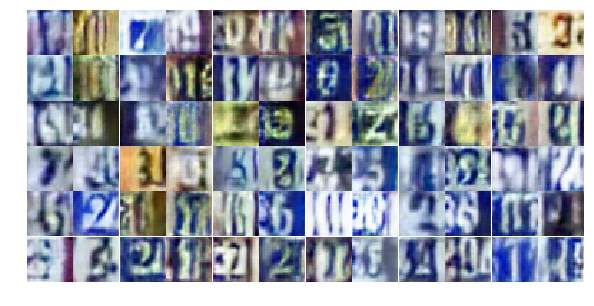

Epoch 15/25... Discriminator Loss: 0.5312... Generator Loss: 1.3330
Epoch 15/25... Discriminator Loss: 0.0984... Generator Loss: 3.2387
Epoch 15/25... Discriminator Loss: 0.2701... Generator Loss: 2.2945
Epoch 15/25... Discriminator Loss: 0.3453... Generator Loss: 1.8767
Epoch 15/25... Discriminator Loss: 0.3459... Generator Loss: 1.8309
Epoch 15/25... Discriminator Loss: 1.3251... Generator Loss: 0.7343
Epoch 15/25... Discriminator Loss: 0.5070... Generator Loss: 1.7128
Epoch 16/25... Discriminator Loss: 0.5029... Generator Loss: 1.2936
Epoch 16/25... Discriminator Loss: 0.6233... Generator Loss: 1.0646
Epoch 16/25... Discriminator Loss: 0.4069... Generator Loss: 1.7712
Epoch 16/25... Discriminator Loss: 0.3323... Generator Loss: 1.6523
Epoch 16/25... Discriminator Loss: 0.3817... Generator Loss: 1.8628
Epoch 16/25... Discriminator Loss: 0.2258... Generator Loss: 2.2751
Epoch 16/25... Discriminator Loss: 1.2627... Generator Loss: 0.8134
Epoch 16/25... Discriminator Loss: 0.7952... Gen

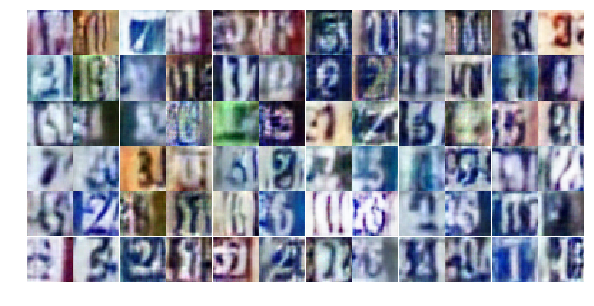

Epoch 16/25... Discriminator Loss: 0.1695... Generator Loss: 3.0720
Epoch 16/25... Discriminator Loss: 0.4004... Generator Loss: 1.8607
Epoch 16/25... Discriminator Loss: 0.5457... Generator Loss: 1.2722
Epoch 16/25... Discriminator Loss: 0.3747... Generator Loss: 1.6089
Epoch 16/25... Discriminator Loss: 0.8291... Generator Loss: 0.7540
Epoch 16/25... Discriminator Loss: 0.4529... Generator Loss: 1.6513
Epoch 16/25... Discriminator Loss: 0.1729... Generator Loss: 2.3835
Epoch 16/25... Discriminator Loss: 0.2781... Generator Loss: 2.4650
Epoch 16/25... Discriminator Loss: 0.3006... Generator Loss: 1.9093
Epoch 16/25... Discriminator Loss: 0.4838... Generator Loss: 1.9394
Epoch 16/25... Discriminator Loss: 0.4734... Generator Loss: 1.3188
Epoch 16/25... Discriminator Loss: 0.4384... Generator Loss: 1.3518
Epoch 16/25... Discriminator Loss: 0.4430... Generator Loss: 1.3912
Epoch 16/25... Discriminator Loss: 0.2696... Generator Loss: 1.9560
Epoch 17/25... Discriminator Loss: 0.5684... Gen

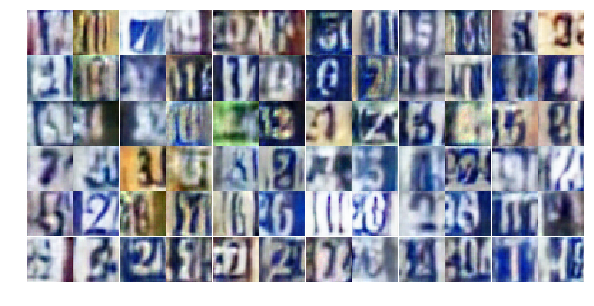

Epoch 17/25... Discriminator Loss: 0.3443... Generator Loss: 1.6591
Epoch 17/25... Discriminator Loss: 0.5025... Generator Loss: 1.4121
Epoch 17/25... Discriminator Loss: 0.3578... Generator Loss: 1.6701
Epoch 17/25... Discriminator Loss: 0.4008... Generator Loss: 1.5203
Epoch 17/25... Discriminator Loss: 0.6623... Generator Loss: 0.9679
Epoch 17/25... Discriminator Loss: 0.2841... Generator Loss: 1.9593
Epoch 17/25... Discriminator Loss: 0.2024... Generator Loss: 2.0716
Epoch 17/25... Discriminator Loss: 0.2159... Generator Loss: 2.0570
Epoch 17/25... Discriminator Loss: 0.2189... Generator Loss: 2.1678
Epoch 17/25... Discriminator Loss: 1.1348... Generator Loss: 0.5862
Epoch 17/25... Discriminator Loss: 0.3505... Generator Loss: 1.6763
Epoch 17/25... Discriminator Loss: 0.2371... Generator Loss: 2.4024
Epoch 17/25... Discriminator Loss: 0.9497... Generator Loss: 0.7230
Epoch 17/25... Discriminator Loss: 0.8232... Generator Loss: 0.8153
Epoch 17/25... Discriminator Loss: 0.4186... Gen

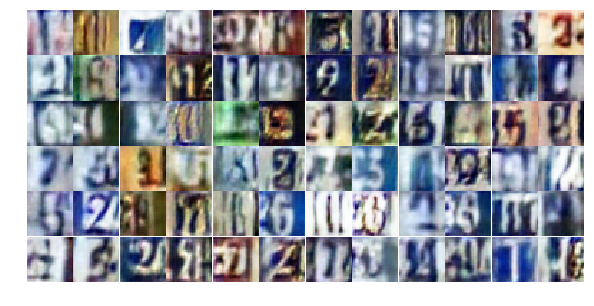

Epoch 17/25... Discriminator Loss: 0.9544... Generator Loss: 0.6391
Epoch 17/25... Discriminator Loss: 0.3728... Generator Loss: 1.6029
Epoch 17/25... Discriminator Loss: 0.5147... Generator Loss: 1.2801
Epoch 17/25... Discriminator Loss: 0.4655... Generator Loss: 1.4129
Epoch 17/25... Discriminator Loss: 0.4901... Generator Loss: 3.2551
Epoch 18/25... Discriminator Loss: 0.7034... Generator Loss: 0.9607
Epoch 18/25... Discriminator Loss: 0.2637... Generator Loss: 1.9922
Epoch 18/25... Discriminator Loss: 0.3670... Generator Loss: 1.5558
Epoch 18/25... Discriminator Loss: 0.3865... Generator Loss: 1.6873
Epoch 18/25... Discriminator Loss: 0.4341... Generator Loss: 1.4081
Epoch 18/25... Discriminator Loss: 0.3355... Generator Loss: 1.7365
Epoch 18/25... Discriminator Loss: 0.0952... Generator Loss: 2.8394
Epoch 18/25... Discriminator Loss: 0.5200... Generator Loss: 1.1919
Epoch 18/25... Discriminator Loss: 0.3871... Generator Loss: 1.5663
Epoch 18/25... Discriminator Loss: 0.3956... Gen

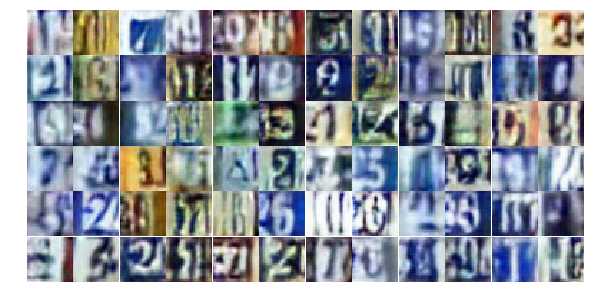

Epoch 18/25... Discriminator Loss: 0.3397... Generator Loss: 1.7502
Epoch 18/25... Discriminator Loss: 0.7872... Generator Loss: 0.7832
Epoch 18/25... Discriminator Loss: 1.1399... Generator Loss: 0.6019
Epoch 18/25... Discriminator Loss: 0.4314... Generator Loss: 2.1769
Epoch 18/25... Discriminator Loss: 0.2493... Generator Loss: 2.1306
Epoch 18/25... Discriminator Loss: 0.4492... Generator Loss: 1.5007
Epoch 18/25... Discriminator Loss: 0.2741... Generator Loss: 2.0974
Epoch 18/25... Discriminator Loss: 0.2718... Generator Loss: 3.7086
Epoch 18/25... Discriminator Loss: 0.3364... Generator Loss: 1.7246
Epoch 18/25... Discriminator Loss: 0.2849... Generator Loss: 2.0382
Epoch 18/25... Discriminator Loss: 0.5029... Generator Loss: 1.7321
Epoch 18/25... Discriminator Loss: 0.5479... Generator Loss: 1.3030
Epoch 19/25... Discriminator Loss: 0.4600... Generator Loss: 1.6545
Epoch 19/25... Discriminator Loss: 0.3938... Generator Loss: 1.5045
Epoch 19/25... Discriminator Loss: 0.5826... Gen

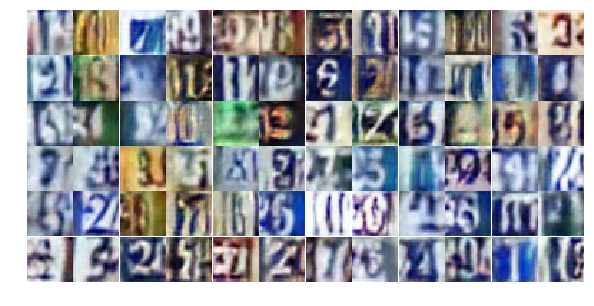

Epoch 19/25... Discriminator Loss: 0.1478... Generator Loss: 2.6259
Epoch 19/25... Discriminator Loss: 1.0506... Generator Loss: 0.5716
Epoch 19/25... Discriminator Loss: 0.2278... Generator Loss: 2.1058
Epoch 19/25... Discriminator Loss: 1.0877... Generator Loss: 0.6062
Epoch 19/25... Discriminator Loss: 0.5197... Generator Loss: 1.4008
Epoch 19/25... Discriminator Loss: 0.6878... Generator Loss: 0.9169
Epoch 19/25... Discriminator Loss: 0.9944... Generator Loss: 0.6887
Epoch 19/25... Discriminator Loss: 0.3830... Generator Loss: 1.5298
Epoch 19/25... Discriminator Loss: 0.2035... Generator Loss: 2.3090
Epoch 19/25... Discriminator Loss: 0.2263... Generator Loss: 2.4834
Epoch 19/25... Discriminator Loss: 0.6200... Generator Loss: 1.2119
Epoch 19/25... Discriminator Loss: 0.5197... Generator Loss: 1.2061
Epoch 19/25... Discriminator Loss: 0.4816... Generator Loss: 1.3596
Epoch 19/25... Discriminator Loss: 0.4869... Generator Loss: 2.4429
Epoch 19/25... Discriminator Loss: 0.5295... Gen

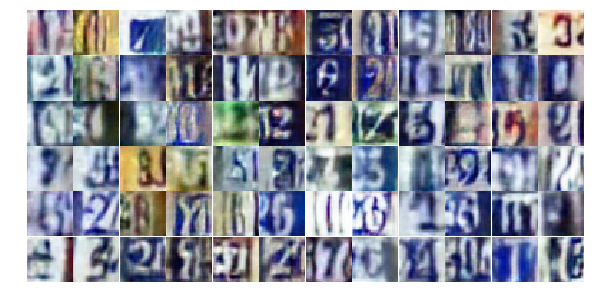

Epoch 19/25... Discriminator Loss: 0.4343... Generator Loss: 1.3489
Epoch 19/25... Discriminator Loss: 0.7005... Generator Loss: 1.0237
Epoch 19/25... Discriminator Loss: 0.4488... Generator Loss: 1.4607
Epoch 20/25... Discriminator Loss: 0.4648... Generator Loss: 1.3381
Epoch 20/25... Discriminator Loss: 0.2855... Generator Loss: 1.8448
Epoch 20/25... Discriminator Loss: 0.2898... Generator Loss: 1.8439
Epoch 20/25... Discriminator Loss: 0.3526... Generator Loss: 1.7389
Epoch 20/25... Discriminator Loss: 0.2462... Generator Loss: 1.9209
Epoch 20/25... Discriminator Loss: 0.2634... Generator Loss: 2.4224
Epoch 20/25... Discriminator Loss: 0.3425... Generator Loss: 1.7092
Epoch 20/25... Discriminator Loss: 0.5349... Generator Loss: 1.2208
Epoch 20/25... Discriminator Loss: 0.5262... Generator Loss: 1.2071
Epoch 20/25... Discriminator Loss: 0.2717... Generator Loss: 2.3412
Epoch 20/25... Discriminator Loss: 0.5757... Generator Loss: 1.3042
Epoch 20/25... Discriminator Loss: 0.4170... Gen

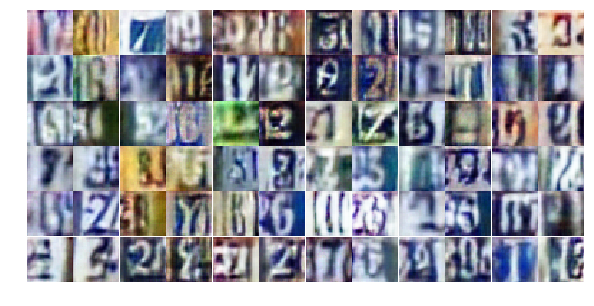

Epoch 20/25... Discriminator Loss: 0.8839... Generator Loss: 3.1976
Epoch 20/25... Discriminator Loss: 0.3578... Generator Loss: 1.7895
Epoch 20/25... Discriminator Loss: 0.3244... Generator Loss: 1.8810
Epoch 20/25... Discriminator Loss: 0.4877... Generator Loss: 1.2609
Epoch 20/25... Discriminator Loss: 1.3573... Generator Loss: 0.4603
Epoch 20/25... Discriminator Loss: 0.4160... Generator Loss: 1.7536
Epoch 20/25... Discriminator Loss: 0.3754... Generator Loss: 1.5690
Epoch 20/25... Discriminator Loss: 0.3617... Generator Loss: 1.6691
Epoch 20/25... Discriminator Loss: 0.5147... Generator Loss: 1.2889
Epoch 20/25... Discriminator Loss: 0.2988... Generator Loss: 1.8794
Epoch 21/25... Discriminator Loss: 0.3504... Generator Loss: 1.7497
Epoch 21/25... Discriminator Loss: 0.6103... Generator Loss: 1.0324
Epoch 21/25... Discriminator Loss: 0.2827... Generator Loss: 2.1624
Epoch 21/25... Discriminator Loss: 0.5401... Generator Loss: 1.0808
Epoch 21/25... Discriminator Loss: 1.1947... Gen

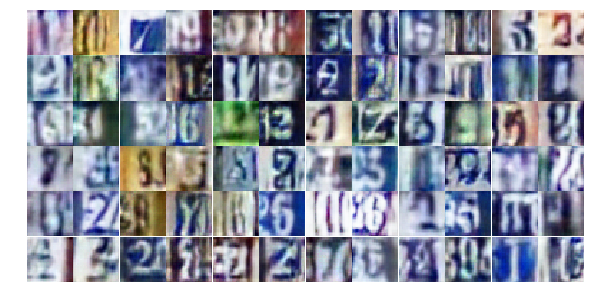

Epoch 21/25... Discriminator Loss: 0.3931... Generator Loss: 1.9482
Epoch 21/25... Discriminator Loss: 0.2460... Generator Loss: 1.9340
Epoch 21/25... Discriminator Loss: 0.3061... Generator Loss: 2.0661
Epoch 21/25... Discriminator Loss: 0.4707... Generator Loss: 1.2829
Epoch 21/25... Discriminator Loss: 0.8335... Generator Loss: 0.8273
Epoch 21/25... Discriminator Loss: 0.3533... Generator Loss: 1.7117
Epoch 21/25... Discriminator Loss: 0.2285... Generator Loss: 2.3757
Epoch 21/25... Discriminator Loss: 1.9060... Generator Loss: 0.3786
Epoch 21/25... Discriminator Loss: 0.6497... Generator Loss: 2.1192
Epoch 21/25... Discriminator Loss: 0.3380... Generator Loss: 1.7111
Epoch 21/25... Discriminator Loss: 0.2854... Generator Loss: 1.9818
Epoch 21/25... Discriminator Loss: 0.2730... Generator Loss: 3.4081
Epoch 21/25... Discriminator Loss: 0.4607... Generator Loss: 1.3343
Epoch 21/25... Discriminator Loss: 0.2005... Generator Loss: 2.2345
Epoch 21/25... Discriminator Loss: 1.1111... Gen

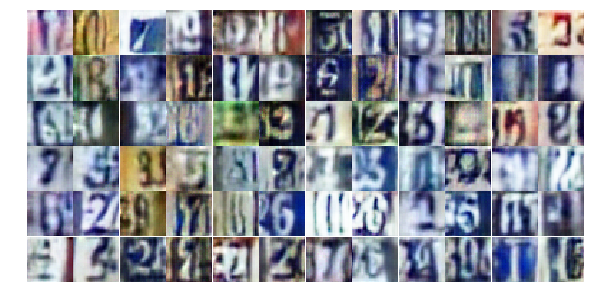

Epoch 21/25... Discriminator Loss: 0.5317... Generator Loss: 1.1664
Epoch 22/25... Discriminator Loss: 0.4820... Generator Loss: 1.5970
Epoch 22/25... Discriminator Loss: 0.2380... Generator Loss: 2.1298
Epoch 22/25... Discriminator Loss: 0.3492... Generator Loss: 1.6745
Epoch 22/25... Discriminator Loss: 0.4960... Generator Loss: 1.3311
Epoch 22/25... Discriminator Loss: 0.5046... Generator Loss: 1.2194
Epoch 22/25... Discriminator Loss: 0.6532... Generator Loss: 0.9999
Epoch 22/25... Discriminator Loss: 0.7836... Generator Loss: 0.8038
Epoch 22/25... Discriminator Loss: 0.5089... Generator Loss: 1.3200
Epoch 22/25... Discriminator Loss: 0.2359... Generator Loss: 1.9894
Epoch 22/25... Discriminator Loss: 1.0795... Generator Loss: 0.5167
Epoch 22/25... Discriminator Loss: 0.4076... Generator Loss: 2.0475
Epoch 22/25... Discriminator Loss: 0.2536... Generator Loss: 2.2933
Epoch 22/25... Discriminator Loss: 0.6755... Generator Loss: 0.9787
Epoch 22/25... Discriminator Loss: 0.3682... Gen

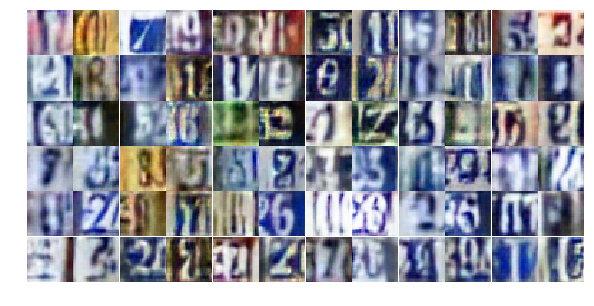

Epoch 22/25... Discriminator Loss: 0.5827... Generator Loss: 1.1250
Epoch 22/25... Discriminator Loss: 0.2384... Generator Loss: 1.9244
Epoch 22/25... Discriminator Loss: 1.3328... Generator Loss: 0.4924
Epoch 22/25... Discriminator Loss: 0.3437... Generator Loss: 1.7733
Epoch 22/25... Discriminator Loss: 0.6842... Generator Loss: 0.9130
Epoch 22/25... Discriminator Loss: 0.3726... Generator Loss: 1.6682
Epoch 22/25... Discriminator Loss: 0.5814... Generator Loss: 1.1361
Epoch 22/25... Discriminator Loss: 0.4515... Generator Loss: 1.5119
Epoch 23/25... Discriminator Loss: 0.3663... Generator Loss: 1.7675
Epoch 23/25... Discriminator Loss: 0.4160... Generator Loss: 1.3843
Epoch 23/25... Discriminator Loss: 0.2705... Generator Loss: 1.7119
Epoch 23/25... Discriminator Loss: 0.1913... Generator Loss: 2.3350
Epoch 23/25... Discriminator Loss: 0.6829... Generator Loss: 0.9918
Epoch 23/25... Discriminator Loss: 0.2852... Generator Loss: 1.9831
Epoch 23/25... Discriminator Loss: 0.2252... Gen

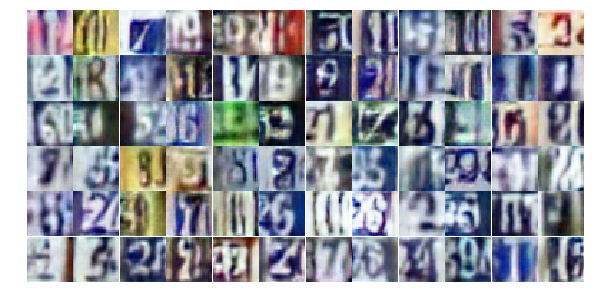

Epoch 23/25... Discriminator Loss: 0.7075... Generator Loss: 1.0068
Epoch 23/25... Discriminator Loss: 0.3266... Generator Loss: 2.1833
Epoch 23/25... Discriminator Loss: 0.2858... Generator Loss: 1.9538
Epoch 23/25... Discriminator Loss: 0.8419... Generator Loss: 2.5814
Epoch 23/25... Discriminator Loss: 0.3764... Generator Loss: 1.9854
Epoch 23/25... Discriminator Loss: 0.6502... Generator Loss: 1.1547
Epoch 23/25... Discriminator Loss: 0.2762... Generator Loss: 2.1616
Epoch 23/25... Discriminator Loss: 0.2622... Generator Loss: 2.2281
Epoch 23/25... Discriminator Loss: 0.2063... Generator Loss: 2.2259
Epoch 23/25... Discriminator Loss: 0.4103... Generator Loss: 1.5949
Epoch 23/25... Discriminator Loss: 0.3723... Generator Loss: 1.6764
Epoch 23/25... Discriminator Loss: 0.4417... Generator Loss: 1.3899
Epoch 23/25... Discriminator Loss: 0.2397... Generator Loss: 1.9969
Epoch 23/25... Discriminator Loss: 0.5014... Generator Loss: 1.2969
Epoch 23/25... Discriminator Loss: 0.3293... Gen

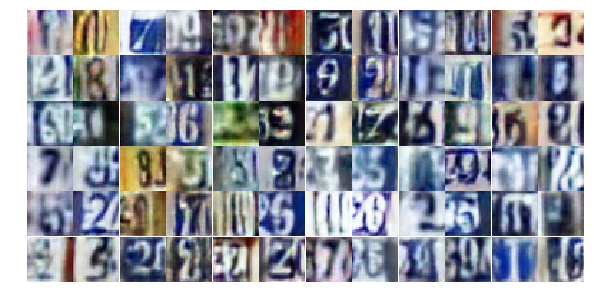

Epoch 24/25... Discriminator Loss: 1.3446... Generator Loss: 2.8312
Epoch 24/25... Discriminator Loss: 0.2593... Generator Loss: 2.0420
Epoch 24/25... Discriminator Loss: 0.2624... Generator Loss: 1.9673
Epoch 24/25... Discriminator Loss: 0.2548... Generator Loss: 3.2520
Epoch 24/25... Discriminator Loss: 0.6846... Generator Loss: 0.9114
Epoch 24/25... Discriminator Loss: 0.2917... Generator Loss: 2.1860
Epoch 24/25... Discriminator Loss: 0.3871... Generator Loss: 1.7251
Epoch 24/25... Discriminator Loss: 0.3494... Generator Loss: 1.8849
Epoch 24/25... Discriminator Loss: 0.4032... Generator Loss: 1.4656
Epoch 24/25... Discriminator Loss: 0.3461... Generator Loss: 1.5474
Epoch 24/25... Discriminator Loss: 0.4437... Generator Loss: 1.4934
Epoch 24/25... Discriminator Loss: 0.4570... Generator Loss: 1.3443
Epoch 24/25... Discriminator Loss: 0.7469... Generator Loss: 0.9158
Epoch 24/25... Discriminator Loss: 0.5829... Generator Loss: 1.2050
Epoch 24/25... Discriminator Loss: 0.2223... Gen

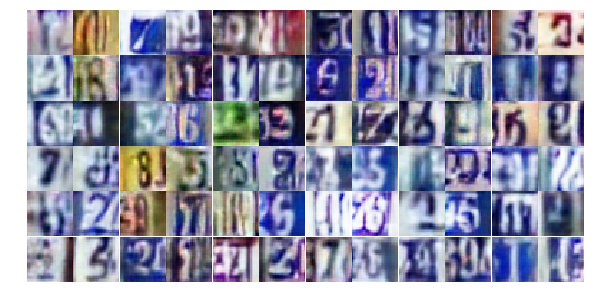

Epoch 24/25... Discriminator Loss: 0.7964... Generator Loss: 0.9091
Epoch 24/25... Discriminator Loss: 1.0134... Generator Loss: 0.6730
Epoch 24/25... Discriminator Loss: 0.5652... Generator Loss: 1.1181
Epoch 24/25... Discriminator Loss: 1.0077... Generator Loss: 3.4605
Epoch 24/25... Discriminator Loss: 0.4355... Generator Loss: 1.6365
Epoch 24/25... Discriminator Loss: 0.6441... Generator Loss: 1.0591
Epoch 25/25... Discriminator Loss: 0.3013... Generator Loss: 1.7638
Epoch 25/25... Discriminator Loss: 0.3505... Generator Loss: 1.8815
Epoch 25/25... Discriminator Loss: 0.3639... Generator Loss: 1.5326
Epoch 25/25... Discriminator Loss: 0.4348... Generator Loss: 1.6218
Epoch 25/25... Discriminator Loss: 0.6779... Generator Loss: 1.0821
Epoch 25/25... Discriminator Loss: 0.4146... Generator Loss: 1.6159
Epoch 25/25... Discriminator Loss: 0.8489... Generator Loss: 0.7845
Epoch 25/25... Discriminator Loss: 0.2662... Generator Loss: 2.0094
Epoch 25/25... Discriminator Loss: 0.2679... Gen

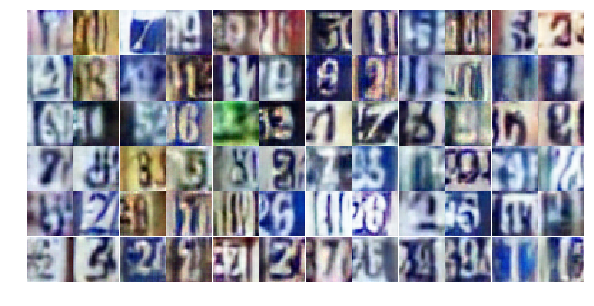

Epoch 25/25... Discriminator Loss: 0.2447... Generator Loss: 1.9221
Epoch 25/25... Discriminator Loss: 0.3736... Generator Loss: 1.5460
Epoch 25/25... Discriminator Loss: 0.5596... Generator Loss: 1.2633
Epoch 25/25... Discriminator Loss: 0.5366... Generator Loss: 1.3046
Epoch 25/25... Discriminator Loss: 0.4558... Generator Loss: 1.3673
Epoch 25/25... Discriminator Loss: 0.5796... Generator Loss: 1.1702
Epoch 25/25... Discriminator Loss: 0.4193... Generator Loss: 1.3904
Epoch 25/25... Discriminator Loss: 0.6034... Generator Loss: 1.2864
Epoch 25/25... Discriminator Loss: 1.0253... Generator Loss: 0.6234
Epoch 25/25... Discriminator Loss: 0.5531... Generator Loss: 1.1875
Epoch 25/25... Discriminator Loss: 0.2652... Generator Loss: 2.2091
Epoch 25/25... Discriminator Loss: 0.4151... Generator Loss: 1.6170
Epoch 25/25... Discriminator Loss: 0.2881... Generator Loss: 2.0796


In [19]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

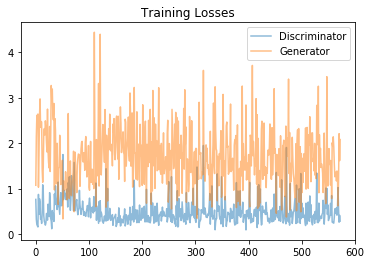

In [20]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

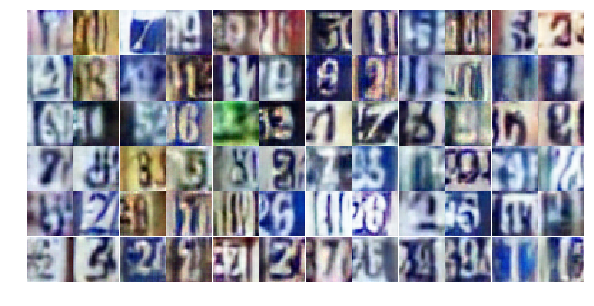

In [21]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))